##### Copyright 2019 The TensorFlow Authors.

In [ ]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# Dogs vs Cats Image Classification With Image Augmentation

<table class="tfo-notebook-buttons" align="left">
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/tensorflow/examples/blob/master/courses/udacity_intro_to_tensorflow_for_deep_learning/l05c02_dogs_vs_cats_with_augmentation.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab</a>
  </td>
  <td>
    <a target="_blank" href="https://github.com/tensorflow/examples/blob/master/courses/udacity_intro_to_tensorflow_for_deep_learning/l05c02_dogs_vs_cats_with_augmentation.ipynb"><img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View source on GitHub</a>
  </td>
</table>

In this tutorial, we will discuss how to classify images into pictures of cats or pictures of dogs. We'll build an image classifier using `tf.keras.Sequential` model and load data using `tf.keras.preprocessing.image.ImageDataGenerator`.

## Specific concepts that will be covered:
In the process, we will build practical experience and develop intuition around the following concepts

* Building _data input pipelines_ using the `tf.keras.preprocessing.image.ImageDataGenerator` class — How can we efficiently work with data on disk to interface with our model?
* _Overfitting_ - what is it, how to identify it, and how can we prevent it?
* _Data Augmentation_ and _Dropout_ - Key techniques to fight overfitting in computer vision tasks that we will incorporate into our data pipeline and image classifier model.

## We will follow the general machine learning workflow:

1. Examine and understand data
2. Build an input pipeline
3. Build our model
4. Train our model
5. Test our model
6. Improve our model/Repeat the process

<hr>

**Before you begin**

Before running the code in this notebook, reset the runtime by going to **Runtime -> Reset all runtimes** in the menu above. If you have been working through several notebooks, this will help you avoid reaching Colab's memory limits.


# Importing packages

Let's start by importing required packages:

*   os — to read files and directory structure
*   numpy — for some matrix math outside of TensorFlow
*   matplotlib.pyplot — to plot the graph and display images in our training and validation data

In [ ]:
import tensorflow as tf

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt

# Data Loading

To build our image classifier, we begin by downloading the dataset. The dataset we are using is a filtered version of <a href="https://www.kaggle.com/c/dogs-vs-cats/data" target="_blank">Dogs vs. Cats</a> dataset from Kaggle (ultimately, this dataset is provided by Microsoft Research).

In previous Colabs, we've used <a href="https://www.tensorflow.org/datasets" target="_blank">TensorFlow Datasets</a>, which is a very easy and convenient way to use datasets. In this Colab however, we will make use of the class `tf.keras.preprocessing.image.ImageDataGenerator` which will read data from disk. We therefore need to directly download *Dogs vs. Cats* from a URL and unzip it to the Colab filesystem.

In [ ]:
_URL = 'https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip'

zip_dir = tf.keras.utils.get_file('cats_and_dogs_filterted.zip', origin=_URL, extract=True)

68606236/68606236 [==============================] - 4s 0us/step


The dataset we have downloaded has following directory structure.

<pre style="font-size: 10.0pt; font-family: Arial; line-height: 2; letter-spacing: 1.0pt;" >
<b>cats_and_dogs_filtered</b>
|__ <b>train</b>
    |______ <b>cats</b>: [cat.0.jpg, cat.1.jpg, cat.2.jpg ....]
    |______ <b>dogs</b>: [dog.0.jpg, dog.1.jpg, dog.2.jpg ...]
|__ <b>validation</b>
    |______ <b>cats</b>: [cat.2000.jpg, cat.2001.jpg, cat.2002.jpg ....]
    |______ <b>dogs</b>: [dog.2000.jpg, dog.2001.jpg, dog.2002.jpg ...]
</pre>

We'll now assign variables with the proper file path for the training and validation sets.

In [ ]:
base_dir = os.path.join(os.path.dirname(zip_dir), 'cats_and_dogs_filtered')
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')

In [ ]:
train_cats_dir = os.path.join(train_dir, 'cats')  # directory with our training cat pictures
train_dogs_dir = os.path.join(train_dir, 'dogs')  # directory with our training dog pictures
validation_cats_dir = os.path.join(validation_dir, 'cats')  # directory with our validation cat pictures
validation_dogs_dir = os.path.join(validation_dir, 'dogs')  # directory with our validation dog pictures

### Understanding our data

Let's look at how many cats and dogs images we have in our training and validation directory

In [ ]:
num_cats_tr = len(os.listdir(train_cats_dir))
num_dogs_tr = len(os.listdir(train_dogs_dir))

num_cats_val = len(os.listdir(validation_cats_dir))
num_dogs_val = len(os.listdir(validation_dogs_dir))

total_train = num_cats_tr + num_dogs_tr
total_val = num_cats_val + num_dogs_val

In [ ]:
print('total training cat images:', num_cats_tr)
print('total training dog images:', num_dogs_tr)

print('total validation cat images:', num_cats_val)
print('total validation dog images:', num_dogs_val)
print("--")
print("Total training images:", total_train)
print("Total validation images:", total_val)

total training cat images: 1000
total training dog images: 1000
total validation cat images: 500
total validation dog images: 500
--
Total training images: 2000
Total validation images: 1000


# Setting Model Parameters

For convenience, let us set up variables that will be used later while pre-processing our dataset and training our network.

In [ ]:
BATCH_SIZE = 100
IMG_SHAPE  = 150 # Our training data consists of images with width of 150 pixels and height of 150 pixels

After defining our generators for training and validation images, **flow_from_directory** method will load images from the disk and will apply rescaling and will resize them into required dimensions using single line of code.

# Data Augmentation

Overfitting often occurs when we have a small number of training examples. One way to fix this problem is to augment our dataset so that it has sufficient number and variety of training examples. Data augmentation takes the approach of generating more training data from existing training samples, by augmenting the samples through random transformations that yield believable-looking images. The goal is that at training time, your model will never see the exact same picture twice. This exposes the model to more aspects of the data, allowing it to generalize better.

In **tf.keras** we can implement this using the same **ImageDataGenerator** class we used before. We can simply pass different transformations we would want to our dataset as a form of arguments and it will take care of applying it to the dataset during our training process.

To start off, let's define a function that can display an image, so we can see the type of augmentation that has been performed. Then, we'll look at specific augmentations that we'll use during training.

In [ ]:
# This function will plot images in the form of a grid with 1 row and 5 columns where images are placed in each column.
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(20,20))
    axes = axes.flatten()
    for img, ax in zip(images_arr, axes):
        ax.imshow(img)
    plt.tight_layout()
    plt.show()

### Flipping the image horizontally

We can begin by randomly applying horizontal flip augmentation to our dataset and seeing how individual images will look after the transformation. This is achieved by passing `horizontal_flip=True` as an argument to the `ImageDataGenerator` class.

In [ ]:
image_gen = ImageDataGenerator(rescale=1./255, horizontal_flip=True)

train_data_gen = image_gen.flow_from_directory(batch_size=BATCH_SIZE,
                                               directory=train_dir,
                                               shuffle=True,
                                               target_size=(IMG_SHAPE,IMG_SHAPE))

Found 2000 images belonging to 2 classes.


To see the transformation in action, let's take one sample image from our training set and repeat it five times. The augmentation will be randomly applied (or not) to each repetition.

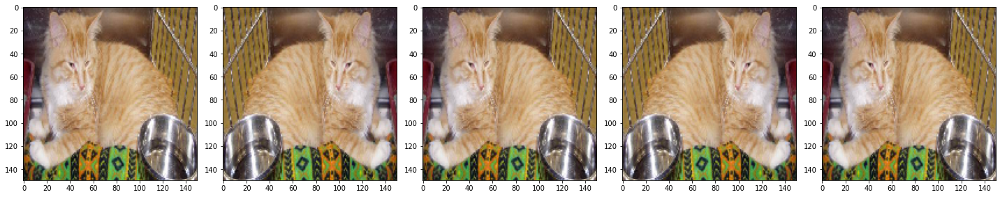

In [ ]:
augmented_images = [train_data_gen[0][0][0] for i in range(5)]
plotImages(augmented_images)

### Rotating the image

The rotation augmentation will randomly rotate the image up to a specified number of degrees. Here, we'll set it to 45.

In [ ]:
image_gen = ImageDataGenerator(rescale=1./255, rotation_range=45)

train_data_gen = image_gen.flow_from_directory(batch_size=BATCH_SIZE,
                                               directory=train_dir,
                                               shuffle=True,
                                               target_size=(IMG_SHAPE, IMG_SHAPE))

Found 2000 images belonging to 2 classes.


To see the transformation in action, let's once again take a sample image from our training set and repeat it. The augmentation will be randomly applied (or not) to each repetition.

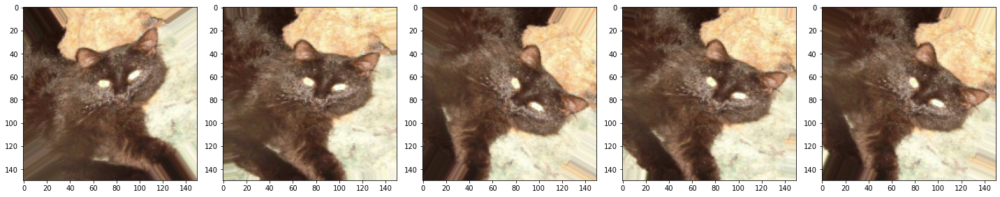

In [ ]:
augmented_images = [train_data_gen[0][0][0] for i in range(5)]
plotImages(augmented_images)

### Applying Zoom

We can also apply Zoom augmentation to our dataset, zooming images up to 50% randomly.

In [ ]:
image_gen = ImageDataGenerator(rescale=1./255, zoom_range=0.5)

train_data_gen = image_gen.flow_from_directory(batch_size=BATCH_SIZE,
                                               directory=train_dir,
                                               shuffle=True,
                                               target_size=(IMG_SHAPE, IMG_SHAPE))

Found 2000 images belonging to 2 classes.


One more time, take a sample image from our training set and repeat it. The augmentation will be randomly applied (or not) to each repetition.

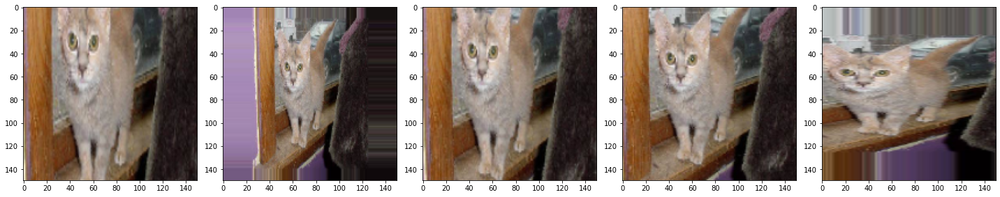

In [ ]:
augmented_images = [train_data_gen[0][0][0] for i in range(5)]
plotImages(augmented_images)

### Putting it all together

We can apply all these augmentations, and even others, with just one line of code, by passing the augmentations as arguments with proper values.

Here, we have applied rescale, rotation of 45 degrees, width shift, height shift, horizontal flip, and zoom augmentation to our training images.

In [ ]:
image_gen_train = ImageDataGenerator(
      rescale=1./255,
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

train_data_gen = image_gen_train.flow_from_directory(batch_size=BATCH_SIZE,
                                                     directory=train_dir,
                                                     shuffle=True,
                                                     target_size=(IMG_SHAPE,IMG_SHAPE),
                                                     class_mode='binary')

Found 2000 images belonging to 2 classes.


Let's visualize how a single image would look like five different times, when we pass these augmentations randomly to our dataset.

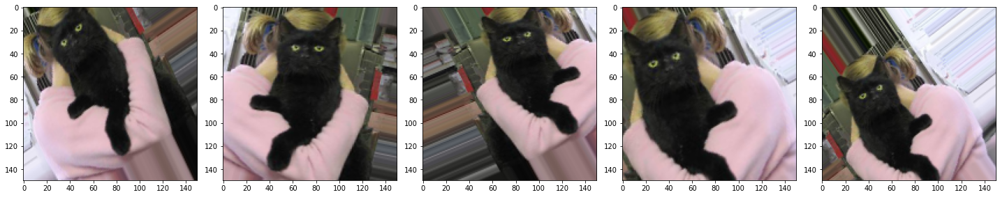

In [ ]:
augmented_images = [train_data_gen[0][0][0] for i in range(5)]
plotImages(augmented_images)

### Creating Validation Data generator

Generally, we only apply data augmentation to our training examples, since the original images should be representative of what our model needs to manage. So, in this case we are only rescaling our validation images and converting them into batches using ImageDataGenerator.

In [ ]:
image_gen_val = ImageDataGenerator(rescale=1./255)

val_data_gen = image_gen_val.flow_from_directory(batch_size=BATCH_SIZE,
                                                 directory=validation_dir,
                                                 target_size=(IMG_SHAPE, IMG_SHAPE),
                                                 class_mode='binary')

Found 1000 images belonging to 2 classes.


# Model Creation

## Define the model

The model consists of four convolution blocks with a max pool layer in each of them.

Before the final Dense layers, we're also applying a Dropout probability of 0.5. It means that 50% of the values coming into the Dropout layer will be set to zero. This helps to prevent overfitting.

Then we have a fully connected layer with 512 units, with a `relu` activation function. The model will output class probabilities for two classes — dogs and cats — using `softmax`.

In [ ]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(150, 150, 3)),
    tf.keras.layers.MaxPooling2D(2, 2),

    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dense(2)
])

### Compiling the model

As usual, we will use the `adam` optimizer. Since we output a softmax categorization, we'll use `sparse_categorical_crossentropy` as the loss function. We would also like to look at training and validation accuracy on each epoch as we train our network, so we are passing in the metrics argument.

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

### Model Summary

Let's look at all the layers of our network using **summary** method.

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 17, 17, 128)      0

### Train the model

It's time we train our network.

Since our batches are coming from a generator (`ImageDataGenerator`), we'll use `fit_generator` instead of `fit`.

In [ ]:
epochs=100
history = model.fit_generator(
    train_data_gen,
    steps_per_epoch=int(np.ceil(total_train / float(BATCH_SIZE))),
    epochs=epochs,
    validation_data=val_data_gen,
    validation_steps=int(np.ceil(total_val / float(BATCH_SIZE)))
    )

<ipython-input-24-669b5ab4f7ba>:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(


Epoch 1/100
20/20 [==============================] - 25s 783ms/step - loss: 0.7328 - accuracy: 0.4785 - val_loss: 0.6930 - val_accuracy: 0.5000
Epoch 2/100
20/20 [==============================] - 16s 791ms/step - loss: 0.6930 - accuracy: 0.5005 - val_loss: 0.6919 - val_accuracy: 0.5000
Epoch 3/100
20/20 [==============================] - 16s 798ms/step - loss: 0.6934 - accuracy: 0.5000 - val_loss: 0.6912 - val_accuracy: 0.5030
Epoch 4/100
20/20 [==============================] - 16s 795ms/step - loss: 0.6922 - accuracy: 0.5250 - val_loss: 0.6836 - val_accuracy: 0.5750
Epoch 5/100
20/20 [==============================] - 16s 803ms/step - loss: 0.6865 - accuracy: 0.5460 - val_loss: 0.6792 - val_accuracy: 0.5020
Epoch 6/100
20/20 [==============================] - 16s 793ms/step - loss: 0.6834 - accuracy: 0.5630 - val_loss: 0.6675 - val_accuracy: 0.5890
Epoch 7/100
20/20 [==============================] - 16s 804ms/step - loss: 0.6732 - accuracy: 0.5805 - val_loss: 0.6623 - val_accuracy:

### Visualizing results of the training

We'll now visualize the results we get after training our network.

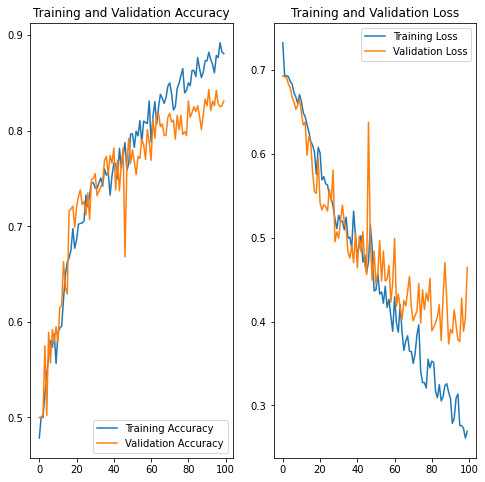

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

# Using Tensorflow 2.x methods

In [ ]:
import tensorflow as tf

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
_URL = 'https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip'

zip_dir = tf.keras.utils.get_file('cats_and_dogs_filterted.zip', origin=_URL, extract=True)

68606236/68606236 [==============================] - 2s 0us/step


The dataset we have downloaded has following directory structure.

<pre style="font-size: 10.0pt; font-family: Arial; line-height: 2; letter-spacing: 1.0pt;" >
<b>cats_and_dogs_filtered</b>
|__ <b>train</b>
    |______ <b>cats</b>: [cat.0.jpg, cat.1.jpg, cat.2.jpg ....]
    |______ <b>dogs</b>: [dog.0.jpg, dog.1.jpg, dog.2.jpg ...]
|__ <b>validation</b>
    |______ <b>cats</b>: [cat.2000.jpg, cat.2001.jpg, cat.2002.jpg ....]
    |______ <b>dogs</b>: [dog.2000.jpg, dog.2001.jpg, dog.2002.jpg ...]
</pre>

In [ ]:
base_dir = os.path.join(os.path.dirname(zip_dir), 'cats_and_dogs_filtered')
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')

In [ ]:
train_cats_dir = os.path.join(train_dir, 'cats')  # directory with our training cat pictures
train_dogs_dir = os.path.join(train_dir, 'dogs')  # directory with our training dog pictures
validation_cats_dir = os.path.join(validation_dir, 'cats')  # directory with our validation cat pictures
validation_dogs_dir = os.path.join(validation_dir, 'dogs')  # directory with our validation dog pictures

In [ ]:
num_cats_tr = len(os.listdir(train_cats_dir))
num_dogs_tr = len(os.listdir(train_dogs_dir))

num_cats_val = len(os.listdir(validation_cats_dir))
num_dogs_val = len(os.listdir(validation_dogs_dir))

total_train = num_cats_tr + num_dogs_tr
total_val = num_cats_val + num_dogs_val

In [ ]:
print('total training cat images:', num_cats_tr)
print('total training dog images:', num_dogs_tr)

print('total validation cat images:', num_cats_val)
print('total validation dog images:', num_dogs_val)
print("--")
print("Total training images:", total_train)
print("Total validation images:", total_val)

total training cat images: 1000
total training dog images: 1000
total validation cat images: 500
total validation dog images: 500
--
Total training images: 2000
Total validation images: 1000


In [ ]:
BATCH_SIZE = 100
IMG_SHAPE  = 150 # Our training data consists of images with width of 150 pixels and height of 150 pixels

In [ ]:
train_data_gen = tf.keras.utils.image_dataset_from_directory(
    directory=train_dir,
    batch_size=BATCH_SIZE,
    image_size=(IMG_SHAPE, IMG_SHAPE),
    shuffle=True,
    label_mode='binary')

Found 2000 files belonging to 2 classes.


In [ ]:
val_data_gen = tf.keras.utils.image_dataset_from_directory(
    directory=validation_dir,
    batch_size=BATCH_SIZE,
    image_size=(IMG_SHAPE, IMG_SHAPE),
    shuffle=False,
    label_mode='binary')

Found 1000 files belonging to 2 classes.


## Configure the dataset for performance

Make sure to use buffered prefetching, so you can yield data from disk without having I/O become blocking. These are two important methods you should use when loading data:

- `Dataset.cache` keeps the images in memory after they're loaded off disk during the first epoch. This will ensure the dataset does not become a bottleneck while training your model. If your dataset is too large to fit into memory, you can also use this method to create a performant on-disk cache.
- `Dataset.prefetch` overlaps data preprocessing and model execution while training.

Interested readers can learn more about both methods, as well as how to cache data to disk in the *Prefetching* section of the [Better performance with the tf.data API](../../guide/data_performance.ipynb) guide.

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_data_gen = train_data_gen.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_data_gen = val_data_gen.cache().prefetch(buffer_size=AUTOTUNE)

In [ ]:
sample_training_images = iter(train_data_gen)
samples, _ = next(sample_training_images)
samples /= 255

In [ ]:
# This function will plot images in the form of a grid with 1 row and 5 columns where images are placed in each column.
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(20,20))
    axes = axes.flatten()
    for img, ax in zip(images_arr, axes):
        ax.imshow(img)
    plt.tight_layout()
    plt.show()

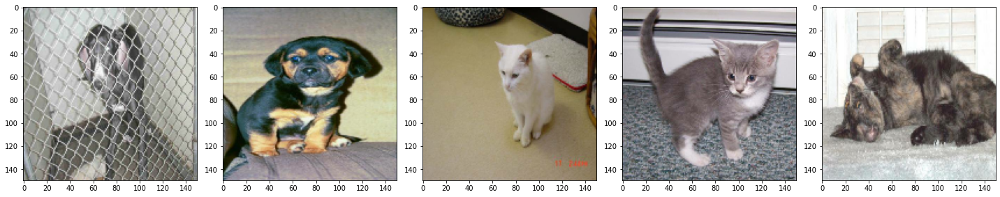

In [ ]:
plotImages(samples[:5]) #plot the first 5 images [0,5)

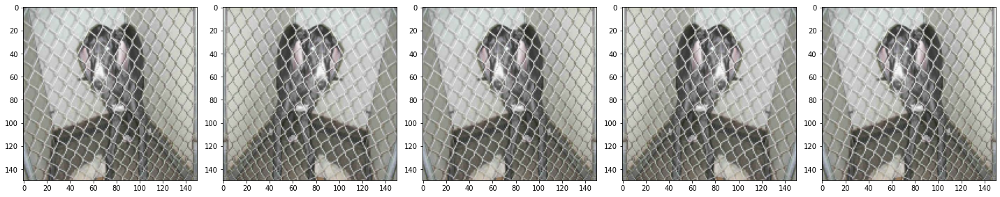

In [ ]:
# Create a data augmentation stage with horizontal flipping, rotations, zooms
# data_augmentation = tf.keras.Sequential([
#         tf.keras.layers.RandomFlip("horizontal")
#     ])
plotImages([tf.keras.layers.RandomFlip("horizontal")(samples[0]) for i in range(5)])

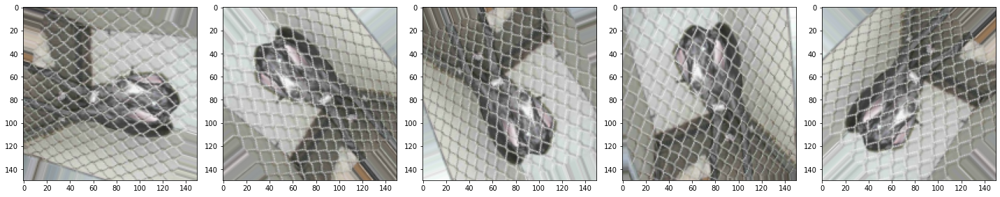

In [ ]:
# data_augmentation = tf.keras.Sequential([
#         tf.keras.layers.RandomRotation(0.45, fill_mode='nearest')
#     ])
plotImages([tf.keras.layers.RandomRotation(0.45, fill_mode='nearest')(samples[0]) for i in range(5)])

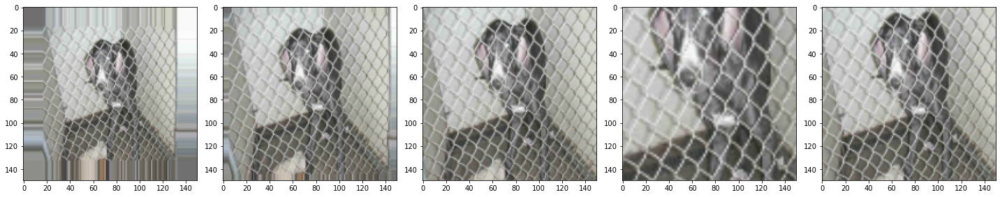

In [ ]:
# data_augmentation = tf.keras.Sequential([
#         tf.keras.layers.RandomZoom(0.5, fill_mode='nearest')
#     ])
plotImages([tf.keras.layers.RandomZoom(0.5, fill_mode='nearest')(samples[0]) for i in range(5)])

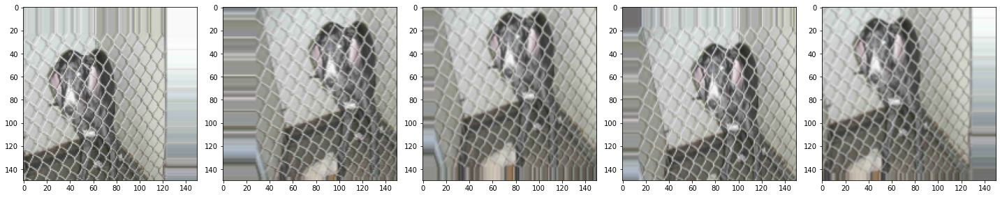

In [ ]:
# data_augmentation = tf.keras.Sequential([
#         tf.keras.layers.RandomTranslation(0.2, 0.2, fill_mode='nearest')
#     ])
plotImages([tf.keras.layers.RandomTranslation(0.2, 0.2, fill_mode='nearest')(samples[0]) for i in range(5)])

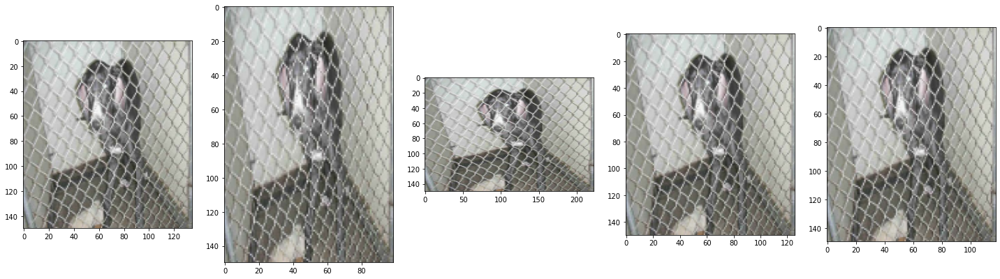

In [ ]:
# data_augmentation = tf.keras.Sequential([
#         tf.keras.layers.RandomWidth(0.2)
#     ])
plotImages([tf.keras.layers.RandomWidth(0.5)(samples[0]) for i in range(5)])

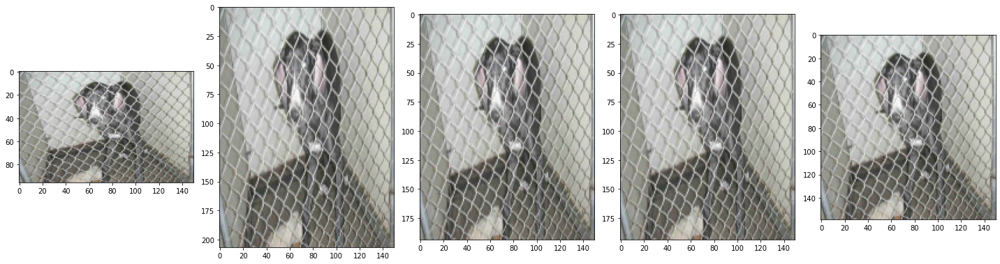

In [ ]:
# data_augmentation = tf.keras.Sequential([
#         tf.keras.layers.RandomHeight(0.2)
#     ])
plotImages([tf.keras.layers.RandomHeight(0.5)(samples[0]) for i in range(5)])

In [ ]:
!pip install keras-cv

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 615.8/615.8 KB 24.0 MB/s eta 0:00:00


In [ ]:
import keras_cv

You do not have Waymo Open Dataset installed, so KerasCV Waymo metrics are not available.


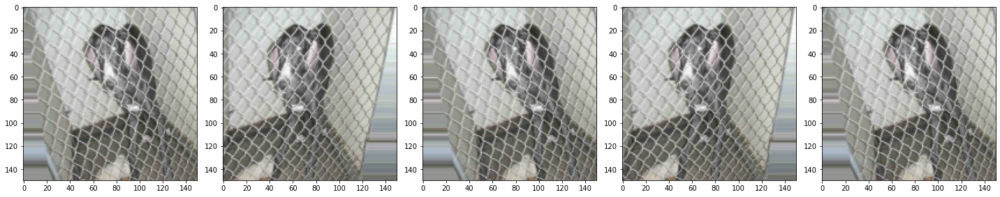

In [ ]:
# data_augmentation = tf.keras.Sequential([
#         keras_cv.keras.layers.RandomShear(0.2)
#     ])
plotImages([keras_cv.layers.RandomShear(0.2, fill_mode='nearest')(samples[0]) for i in range(5)])

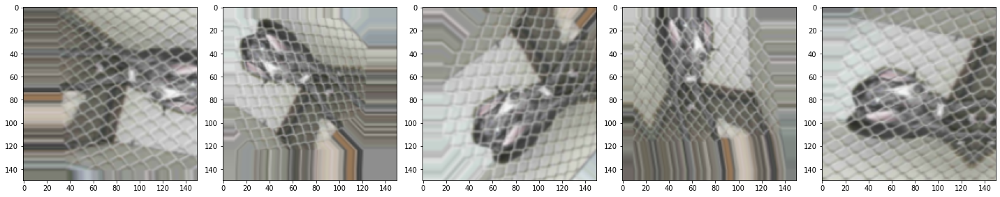

In [ ]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomRotation(0.30, fill_mode='nearest'),
    tf.keras.layers.RandomTranslation(0.1, 0.1, fill_mode='nearest'),
    keras_cv.layers.RandomShear(0.2, fill_mode='nearest'),
    tf.keras.layers.RandomZoom(0.2, fill_mode='nearest'),
    tf.keras.layers.RandomFlip("horizontal")
    ])
plotImages([data_augmentation(samples[0]) for i in range(5)])

### or put the variable data_augmentation as a layer

In [ ]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Rescaling(scale=1./255, input_shape=(150, 150, 3)),

    tf.keras.layers.RandomRotation(0.30, fill_mode='nearest'),
    tf.keras.layers.RandomTranslation(0.1, 0.1, fill_mode='nearest'),
    keras_cv.layers.RandomShear(0.2, fill_mode='nearest'),
    tf.keras.layers.RandomZoom(0.2, fill_mode='nearest'),
    tf.keras.layers.RandomFlip("horizontal"),

    tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),

    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dense(2)
])

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 150, 150, 3)       0         
                                                                 
 random_rotation_8 (RandomRo  (None, 150, 150, 3)      0         
 tation)                                                         
                                                                 
 random_translation_8 (Rando  (None, 150, 150, 3)      0         
 mTranslation)                                                   
                                                                 
 random_shear_28 (RandomShea  (None, 150, 150, 3)      0         
 r)                                                              
                                                                 
 random_zoom_8 (RandomZoom)  (None, 150, 150, 3)       0         
                                                      

In [ ]:
epochs=100
history = model.fit(
    train_data_gen,
    steps_per_epoch=int(np.ceil(total_train / float(BATCH_SIZE))),
    epochs=epochs,
    validation_data=val_data_gen,
    validation_steps=int(np.ceil(total_val / float(BATCH_SIZE)))
    )

Epoch 1/100


20/20 [==============================] - 29s 800ms/step - loss: 0.7086 - accuracy: 0.4965 - val_loss: 0.6926 - val_accuracy: 0.5100
Epoch 2/100
20/20 [==============================] - 17s 792ms/step - loss: 0.6932 - accuracy: 0.5210 - val_loss: 0.6891 - val_accuracy: 0.5960
Epoch 3/100
20/20 [==============================] - 17s 797ms/step - loss: 0.6890 - accuracy: 0.5325 - val_loss: 0.6887 - val_accuracy: 0.5090
Epoch 4/100
20/20 [==============================] - 18s 851ms/step - loss: 0.6783 - accuracy: 0.5590 - val_loss: 0.6606 - val_accuracy: 0.5840
Epoch 5/100
20/20 [==============================] - 18s 900ms/step - loss: 0.6620 - accuracy: 0.6095 - val_loss: 0.6792 - val_accuracy: 0.5810
Epoch 6/100
20/20 [==============================] - 17s 820ms/step - loss: 0.6565 - accuracy: 0.6120 - val_loss: 0.6395 - val_accuracy: 0.6370
Epoch 7/100
20/20 [==============================] - 17s 831ms/step - loss: 0.6559 - accuracy: 0.6100 - val_loss: 0.6610 - val_accuracy: 0.5760
Epoc

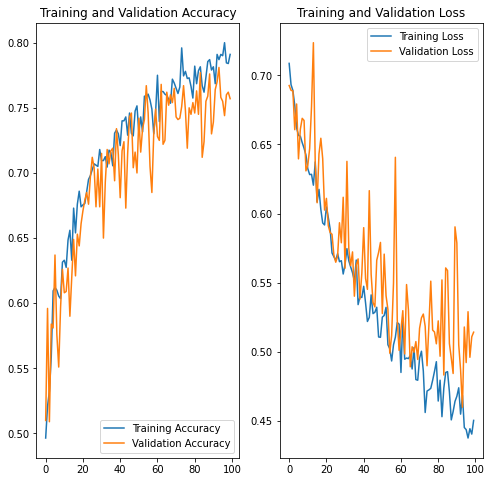

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

# Using Keras 3.0 and jax backend

In [29]:
!pip install -q keras-nightly

In [3]:
!pip install --upgrade keras-cv tensorflow
!pip install --upgrade keras

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 3.5 MB/s eta 0:00:00
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.15.0
    Uninstalling tensorflow-2.15.0:
      Successfully uninstalled tensorflow-2.15.0
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 6.3 MB/s eta 0:00:00
  Attempting uninstall: keras
    Found existing installation: keras 2.15.0
    Uninstalling keras-2.15.0:
      Successfully uninstalled keras-2.15.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.15.0.post1 requires keras<2.16,>=2.15.0, but you have keras 3.0.2 which is incompatible.


In [24]:
import os

os.environ["KERAS_BACKEND"] = "jax"

import keras
import keras_cv
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

In [5]:
_URL = 'https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip'

zip_dir = tf.keras.utils.get_file('cats_and_dogs_filterted.zip', origin=_URL, extract=True)

The dataset we have downloaded has following directory structure.

<pre style="font-size: 10.0pt; font-family: Arial; line-height: 2; letter-spacing: 1.0pt;" >
<b>cats_and_dogs_filtered</b>
|__ <b>train</b>
    |______ <b>cats</b>: [cat.0.jpg, cat.1.jpg, cat.2.jpg ....]
    |______ <b>dogs</b>: [dog.0.jpg, dog.1.jpg, dog.2.jpg ...]
|__ <b>validation</b>
    |______ <b>cats</b>: [cat.2000.jpg, cat.2001.jpg, cat.2002.jpg ....]
    |______ <b>dogs</b>: [dog.2000.jpg, dog.2001.jpg, dog.2002.jpg ...]
</pre>

In [6]:
base_dir = os.path.join(os.path.dirname(zip_dir), 'cats_and_dogs_filtered')
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')

In [7]:
train_cats_dir = os.path.join(train_dir, 'cats')  # directory with our training cat pictures
train_dogs_dir = os.path.join(train_dir, 'dogs')  # directory with our training dog pictures
validation_cats_dir = os.path.join(validation_dir, 'cats')  # directory with our validation cat pictures
validation_dogs_dir = os.path.join(validation_dir, 'dogs')  # directory with our validation dog pictures

In [8]:
num_cats_tr = len(os.listdir(train_cats_dir))
num_dogs_tr = len(os.listdir(train_dogs_dir))

num_cats_val = len(os.listdir(validation_cats_dir))
num_dogs_val = len(os.listdir(validation_dogs_dir))

total_train = num_cats_tr + num_dogs_tr
total_val = num_cats_val + num_dogs_val

In [9]:
print('total training cat images:', num_cats_tr)
print('total training dog images:', num_dogs_tr)

print('total validation cat images:', num_cats_val)
print('total validation dog images:', num_dogs_val)
print("--")
print("Total training images:", total_train)
print("Total validation images:", total_val)

total training cat images: 1000
total training dog images: 1000
total validation cat images: 500
total validation dog images: 500
--
Total training images: 2000
Total validation images: 1000


In [10]:
BATCH_SIZE = 100
IMG_SHAPE  = 150 # Our training data consists of images with width of 150 pixels and height of 150 pixels

In [11]:
train_data_gen = keras.utils.image_dataset_from_directory(
    directory=train_dir,
    batch_size=BATCH_SIZE,
    image_size=(IMG_SHAPE, IMG_SHAPE),
    shuffle=True,
    label_mode='binary')

Found 2000 files belonging to 2 classes.


In [35]:
val_data_gen = keras.utils.image_dataset_from_directory(
    directory=validation_dir,
    batch_size=BATCH_SIZE,
    image_size=(IMG_SHAPE, IMG_SHAPE),
    shuffle=False,
    label_mode='binary')

Found 1000 files belonging to 2 classes.


## Configure the dataset for performance

Make sure to use buffered prefetching, so you can yield data from disk without having I/O become blocking. These are two important methods you should use when loading data:

- `Dataset.cache` keeps the images in memory after they're loaded off disk during the first epoch. This will ensure the dataset does not become a bottleneck while training your model. If your dataset is too large to fit into memory, you can also use this method to create a performant on-disk cache.
- `Dataset.prefetch` overlaps data preprocessing and model execution while training.

Interested readers can learn more about both methods, as well as how to cache data to disk in the *Prefetching* section of the [Better performance with the tf.data API](../../guide/data_performance.ipynb) guide.

In [13]:
AUTOTUNE = tf.data.AUTOTUNE

train_data_gen = train_data_gen.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_data_gen = val_data_gen.cache().prefetch(buffer_size=AUTOTUNE)

In [14]:
sample_training_images = iter(train_data_gen)
samples, _ = next(sample_training_images)
samples /= 255

In [15]:
# This function will plot images in the form of a grid with 1 row and 5 columns where images are placed in each column.
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(20,20))
    axes = axes.flatten()
    for img, ax in zip(images_arr, axes):
        ax.imshow(img)
    plt.tight_layout()
    plt.show()

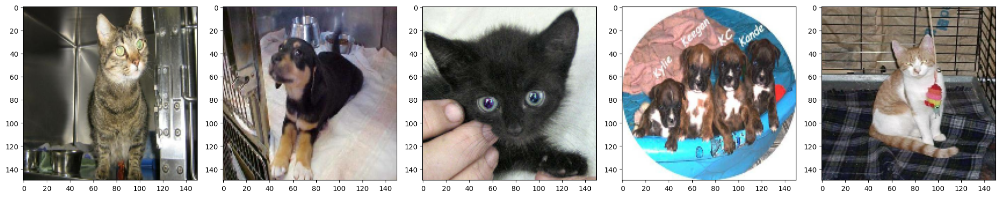

In [16]:
plotImages(samples[:5]) #plot the first 5 images [0,5)

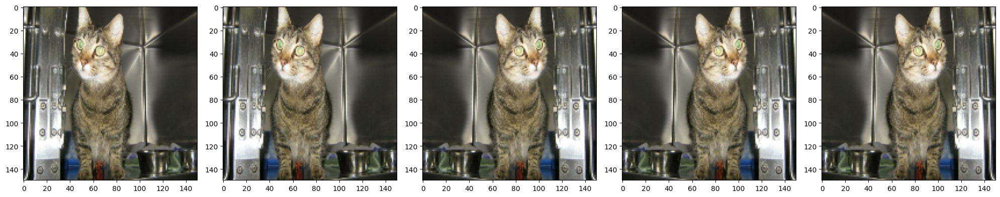

In [17]:
# Create a data augmentation stage with horizontal flipping, rotations, zooms
# data_augmentation = tf.keras.Sequential([
#         tf.keras.layers.RandomFlip("horizontal")
#     ])
plotImages([keras.layers.RandomFlip("horizontal")(samples[0]) for i in range(5)])

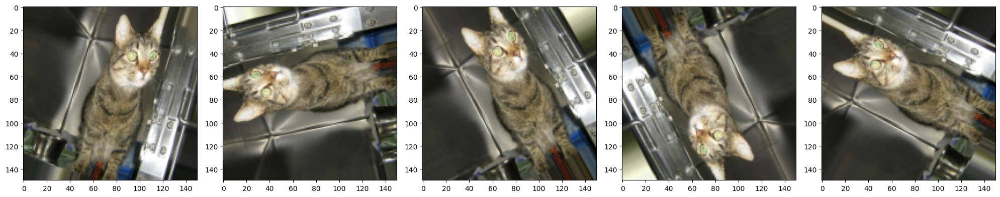

In [18]:
# data_augmentation = tf.keras.Sequential([
#         tf.keras.layers.RandomRotation(0.45, fill_mode='nearest')
#     ])
plotImages([keras.layers.RandomRotation(0.45, fill_mode='nearest')(samples[0]) for i in range(5)])

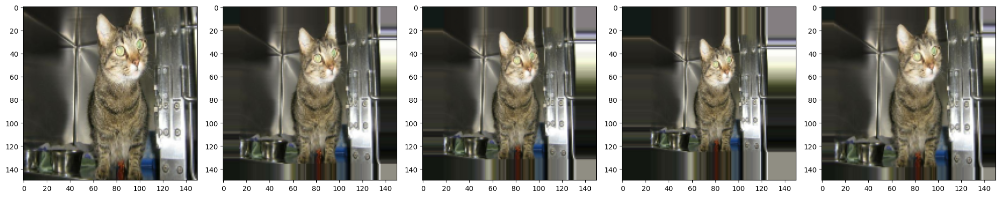

In [19]:
# data_augmentation = tf.keras.Sequential([
#         tf.keras.layers.RandomZoom(0.5, fill_mode='nearest')
#     ])
plotImages([keras.layers.RandomZoom(0.5, fill_mode='nearest')(samples[0]) for i in range(5)])

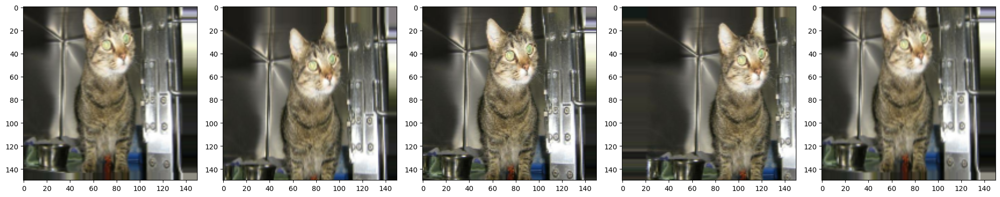

In [20]:
# data_augmentation = tf.keras.Sequential([
#         tf.keras.layers.RandomTranslation(0.2, 0.2, fill_mode='nearest')
#     ])
plotImages([keras.layers.RandomTranslation(0.2, 0.2, fill_mode='nearest')(samples[0]) for i in range(5)])

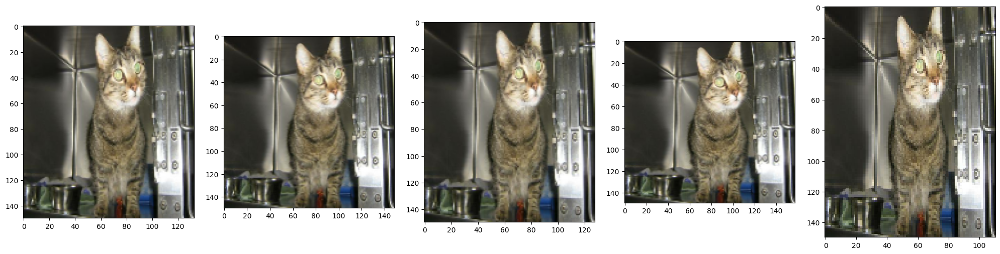

In [21]:
# data_augmentation = tf.keras.Sequential([
#         tf.keras.layers.RandomWidth(0.2)
#     ])
plotImages([tf.keras.layers.RandomWidth(0.5)(samples[0]) for i in range(5)])

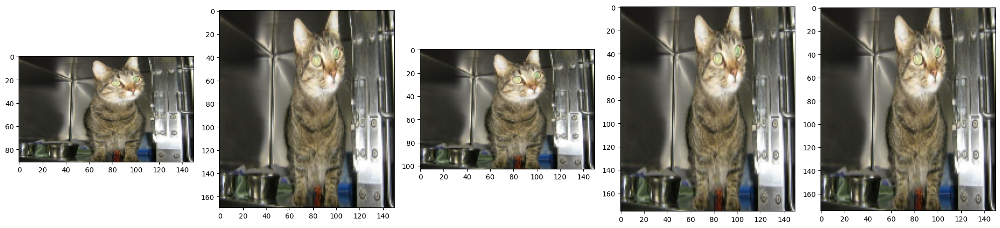

In [22]:
# @title
# data_augmentation = tf.keras.Sequential([
#         tf.keras.layers.RandomHeight(0.2)
#     ])
plotImages([tf.keras.layers.RandomHeight(0.5)(samples[0]) for i in range(5)])

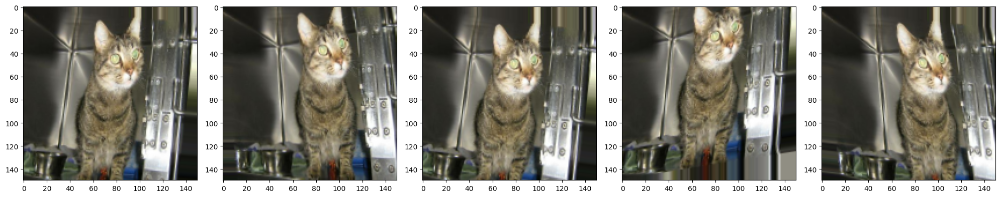

In [28]:
# data_augmentation = tf.keras.Sequential([
#         keras_cv.keras.layers.RandomShear(0.2)
#     ])
plotImages([keras_cv.layers.RandomShear(0.2, 0.2, fill_mode='nearest')(samples[0]) for i in range(5)])

In [36]:
model = keras.models.Sequential([

    keras.Input(shape=(150, 150, 3)),
    keras.layers.Rescaling(scale=1./255),

    keras.layers.RandomRotation(0.30, fill_mode='nearest'),
    keras.layers.RandomTranslation(0.1, 0.1, fill_mode='nearest'),
    keras.layers.RandomZoom(0.2, fill_mode='nearest'),
    keras.layers.RandomFlip("horizontal"),

    keras.layers.Conv2D(32, (3,3), activation='relu'),
    keras.layers.MaxPooling2D(2, 2),

    keras.layers.Conv2D(64, (3,3), activation='relu'),
    keras.layers.MaxPooling2D(2,2),

    keras.layers.Conv2D(128, (3,3), activation='relu'),
    keras.layers.MaxPooling2D(2,2),

    keras.layers.Conv2D(128, (3,3), activation='relu'),
    keras.layers.MaxPooling2D(2,2),

    keras.layers.Dropout(0.5),
    keras.layers.Flatten(),
    keras.layers.Dense(512, activation='relu'),
    keras.layers.Dense(2)
])

In [37]:
model.compile(optimizer='adam',
              loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [38]:
model.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━┓
┃ Layer (type)                       ┃ Output Shape                  ┃     Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━┩
│ rescaling_4 (Rescaling)            │ (None, 150, 150, 3)           │           0 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ random_rotation_9 (RandomRotation) │ (None, 150, 150, 3)           │           0 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ random_translation_9               │ (None, 150, 150, 3)           │           0 │
│ (RandomTranslation)                │                               │             │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ random_zoom_9 (RandomZoom)         │ (None, 150, 150, 3)           │           0 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ random_flip_9 (RandomFlip)         │ (None, 150, 150, 3)           │           0 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ conv2d_16 (Conv2D)                 │ (None, 148, 148, 32)          │         896 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ max_pooling2d_16 (MaxPooling2D)    │ (None, 74, 74, 32)            │           0 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ conv2d_17 (Conv2D)                 │ (None, 72, 72, 64)            │      18,496 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ max_pooling2d_17 (MaxPooling2D)    │ (None, 36, 36, 64)            │           0 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ conv2d_18 (Conv2D)                 │ (None, 34, 34, 128)           │      73,856 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ max_pooling2d_18 (MaxPooling2D)    │ (None, 17, 17, 128)           │           0 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ conv2d_19 (Conv2D)                 │ (None, 15, 15, 128)           │     147,584 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ max_pooling2d_19 (MaxPooling2D)    │ (None, 7, 7, 128)             │           0 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ dropout_4 (Dropout)                │ (None, 7, 7, 128)             │           0 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ flatten_4 (Flatten)                │ (None, 6272)                  │           0 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ dense_8 (Dense)                    │ (None, 512)                   │   3,211,776 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ dense_9 (Dense)                    │ (None, 2)                     │       1,026 │
└────────────────────────────────────┴───────────────────────────────┴─────────────┘

 Total params: 3,453,634 (13.17 MB)

 Trainable params: 3,453,634 (13.17 MB)

 Non-trainable params: 0 (0.00 B)

In [39]:
epochs=100
history = model.fit(
    train_data_gen,
    epochs=epochs,
    validation_data=val_data_gen
    )

Epoch 1/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 496ms/step - accuracy: 0.5123 - loss: 0.9925 - val_accuracy: 0.5000 - val_loss: 0.6925
Epoch 2/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 11s 568ms/step - accuracy: 0.5076 - loss: 0.6935 - val_accuracy: 0.5830 - val_loss: 0.6921
Epoch 3/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 9s 457ms/step - accuracy: 0.5300 - loss: 0.6928 - val_accuracy: 0.5100 - val_loss: 0.6911
Epoch 4/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 11s 578ms/step - accuracy: 0.5226 - loss: 0.6913 - val_accuracy: 0.5000 - val_loss: 0.6899
Epoch 5/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 510ms/step - accuracy: 0.5699 - loss: 0.6853 - val_accuracy: 0.4990 - val_loss: 0.7661
Epoch 6/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 12s 619ms/step - accuracy: 0.4791 - loss: 0.7168 - val_accuracy: 0.5040 - val_loss: 0.6921
Epoch 7/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 9s 441ms/step - accuracy: 0.5388 - loss: 0.6924 - val_accuracy: 0.5680 - val_loss: 0.6831
Epoch 8/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 11s 577ms/step - accuracy: 0.5620 - loss: 0.6873 - va

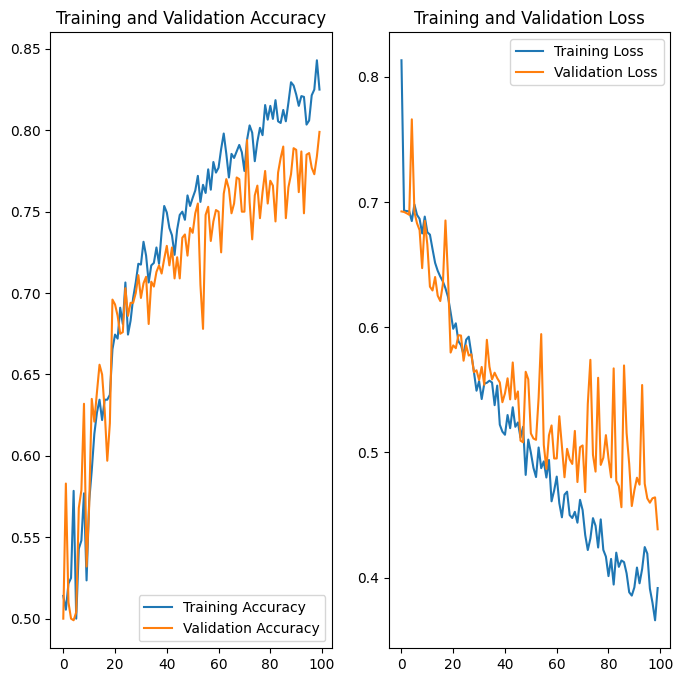

In [40]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

We gain roughly 2x in training speed using jax backend with jit compiling and also a higher accuracy on both training and validation sets